# Deep Iterative Methods for Forward-Backward SDEs

**Author:** Bilal Saleh Husain  
**Institution:** University of Toronto  
**Date:** February 2026

---

## Overview

This notebook demonstrates a production-ready implementation of Deep Picard Iteration methods for solving high-dimensional Forward-Backward Stochastic Differential Equations (FBSDEs). The implementation handles three classes of systems:

1. **Uncoupled FBSDEs** - Standard forward-backward systems
2. **Coupled FBSDEs** - Systems where forward dynamics depend on backward processes
3. **McKean-Vlasov FBSDEs** - Mean-field systems with distribution-dependent coefficients

**Key Features:**
- GPU-accelerated PyTorch implementation
- Scales to higher dimensions
- Validated against analytical solutions

**Applications in Finance:**
- Option pricing in high dimensions
- Portfolio optimization
- Risk management
- Stochastic control problems

In [1]:
import sys
import os
import torch
import numpy as np
import matplotlib.pyplot as plt

sys.path.append(os.path.abspath(os.path.join('..', 'src')))

from dim_fbsde.config import SolverConfig, TrainingConfig

from dim_fbsde.equations import (
    BSBEquation, 
    HureEquation, 
    ZCoupledEquation, 
    FullyCoupledEquation, 
    McKeanVlasovEquation 
)

from dim_fbsde.solvers import (
    UncoupledFBSDESolver,
    CoupledFBSDESolver,
    McKeanVlasovSolver
)

from dim_fbsde.nets import MLP
from dim_fbsde.utils.visualizations import (
    plot_pathwise_comparison,
    plot_Y_error_subplots,
    plot_Z_error_subplots
)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
# Device Configuration
# Note: MPS (Apple Silicon GPU) is available but not enabled by default
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")

Using device: cpu


---

# 1. Black-Scholes-Barenblatt (BSB) Equation

The $d$-dimensional Black-Scholes-Barenblatt FBSDE, adapted from Raissi et al. (2018):

$$
\left\{
\begin{aligned}
dX_t &= \sigma \, \text{diag}(X_t) \, dW_t, \quad X_0 = x_0, \\
-dY_t &= -r \left(Y_t - \frac{1}{\sigma}\bar{Z}_t\right) dt - Z_t dW_t, \\
Y_T &= \|X_T\|_2^2,
\end{aligned}
\right.
$$

where $X_t \in \mathbb{R}^d$ is the vector of asset prices, $Y_t \in \mathbb{R}$, $Z_t \in \mathbb{R}^{1 \times d}$, and $\bar{Z}_t = \sum_{j=1}^d Z_t^j$. The analytical solution is:

$$
\left\{
\begin{aligned}
Y_t &= \exp\left((r + \sigma^2)(T-t)\right) \|X_t\|_2^2, \\
Z_t^j &= 2\sigma \exp\left((r + \sigma^2)(T-t)\right) (X_t^j)^2, \quad \text{for } j=1, \dots, d.
\end{aligned}
\right.
$$

In [3]:
## 1. Configuration

DIM_X = 3

print(f"Running BSB (d={DIM_X}) on {DEVICE}")

# Shared Solver Settings (Physics)
base_solver_cfg = {
    'T': 1.0,
    'N': 120,
    'num_paths': 3000,
    'picard_iterations': 3,
    'device': DEVICE
}

# Training Settings (Optimization) - Shared
train_cfg = TrainingConfig(
    batch_size=500,
    epochs=5,
    learning_rate=1e-4,
    lr_decay_step=1000,
    verbose=True
)

## 2. Equation Setup

# Physics: Black-Scholes-Barenblatt
eqn = BSBEquation(dim_x=DIM_X, r=0.05, sigma=0.4)
input_dim = 1 + DIM_X 
hidden_layers = [40, 40, 40, 40]

## 3. Method 1: Gradient Method

print("\n=== Running Gradient Method ===")
solver_cfg_grad = SolverConfig(**base_solver_cfg, z_method='gradient')

# Network for Y (gradient method doesn't need Z network)
nn_Y_grad = MLP(input_dim=input_dim, output_dim=eqn.dim_y, hidden_dims=hidden_layers)

solver_grad = UncoupledFBSDESolver(
    equation=eqn,
    solver_config=solver_cfg_grad,
    training_config=train_cfg,
    nn_Y=nn_Y_grad,
    nn_Z=None
)

solution_grad = solver_grad.solve()

## 4. Method 2: Regression Method

print("\n=== Running Regression Method ===")
solver_cfg_reg = SolverConfig(**base_solver_cfg, z_method='regression')

# Networks for Y and Z (regression needs both)
nn_Y_reg = MLP(input_dim=input_dim, output_dim=eqn.dim_y, hidden_dims=hidden_layers)
output_dim_z = eqn.dim_y * eqn.dim_w
nn_Z_reg = MLP(input_dim=input_dim, output_dim=output_dim_z, hidden_dims=hidden_layers)

solver_reg = UncoupledFBSDESolver(
    equation=eqn,
    solver_config=solver_cfg_reg,
    training_config=train_cfg,
    nn_Y=nn_Y_reg,
    nn_Z=nn_Z_reg
)

solution_reg = solver_reg.solve()

print("\n✓ Both methods completed successfully")

Running BSB (d=3) on cpu

=== Running Gradient Method ===
2026-02-03 00:00:56 - dim_fbsde.solvers.uncoupled - Starting Uncoupled Solver (gradient)...
2026-02-03 00:00:59 - dim_fbsde.solvers.uncoupled - Picard Iter 1/3: Error=3.8457e+00 | Mean Y_Loss=3.1848e+00
2026-02-03 00:01:01 - dim_fbsde.solvers.uncoupled - Picard Iter 2/3: Error=1.0898e-01 | Mean Y_Loss=2.2359e+00
2026-02-03 00:01:03 - dim_fbsde.solvers.uncoupled - Picard Iter 3/3: Error=1.1024e-01 | Mean Y_Loss=2.2248e+00

=== Running Regression Method ===
2026-02-03 00:01:03 - dim_fbsde.solvers.uncoupled - Starting Uncoupled Solver (regression)...
2026-02-03 00:01:08 - dim_fbsde.solvers.uncoupled - Picard Iter 1/3: Error=3.8762e+00 | Mean Y_Loss=3.3813e+00
2026-02-03 00:01:12 - dim_fbsde.solvers.uncoupled - Picard Iter 2/3: Error=1.2466e-01 | Mean Y_Loss=2.3548e+00
2026-02-03 00:01:16 - dim_fbsde.solvers.uncoupled - Picard Iter 3/3: Error=6.7990e-02 | Mean Y_Loss=2.3461e+00

✓ Both methods completed successfully


2026-02-03 00:01:26 - dim_fbsde.utils.visualizations - Using model-based comparison: evaluating all models on 5 identical X paths


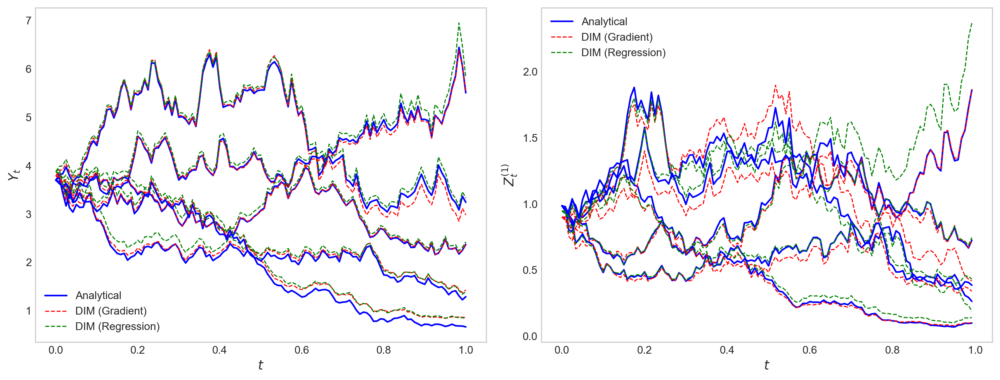

In [4]:
## 5. Method Comparison Visualization

# Compare both methods against analytical solution using model-based evaluation
# This ensures both methods are evaluated on identical X paths for fair comparison
fig, axes = plot_pathwise_comparison(
    solutions=[solution_grad],  # Use X paths from first solution
    labels=['DIM (Gradient)', 'DIM (Regression)'],
    models=[(solver_grad.nn_Y, None), (solver_reg.nn_Y, solver_reg.nn_Z)],
    z_methods=['gradient', 'regression'],
    equation=eqn,  # Required for gradient method to compute Z = σ·∇Y
    analytical_Y_func=eqn.analytical_y,
    analytical_Z_func=eqn.analytical_z,
    analytical_Y_kwargs={'T_terminal': solver_cfg_grad.T},
    analytical_Z_kwargs={'T_terminal': solver_cfg_grad.T},
    component_idx=0,
    device=DEVICE,
    num_paths_to_plot=5
)
plt.show()

Generating Y error plots...
2026-02-03 00:01:29 - dim_fbsde.utils.visualizations - Computing analytical Y for 100 paths...
2026-02-03 00:01:29 - dim_fbsde.utils.visualizations - Computing Y errors for DIM (Gradient)...
2026-02-03 00:01:31 - dim_fbsde.utils.visualizations - Computing Y errors for DIM (Regression)...


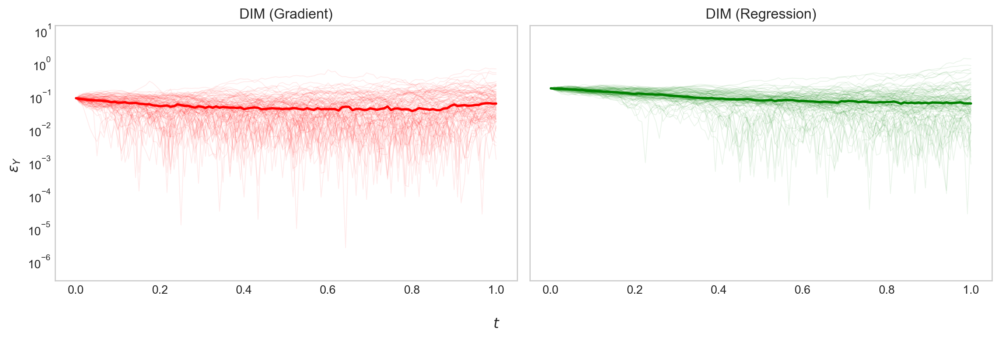

Generating Z error plots...
2026-02-03 00:01:31 - dim_fbsde.utils.visualizations - Computing analytical Z for 100 paths...
2026-02-03 00:01:31 - dim_fbsde.utils.visualizations - Computing Z errors for DIM (Gradient)...
2026-02-03 00:01:32 - dim_fbsde.utils.visualizations - Computing Z errors for DIM (Regression)...


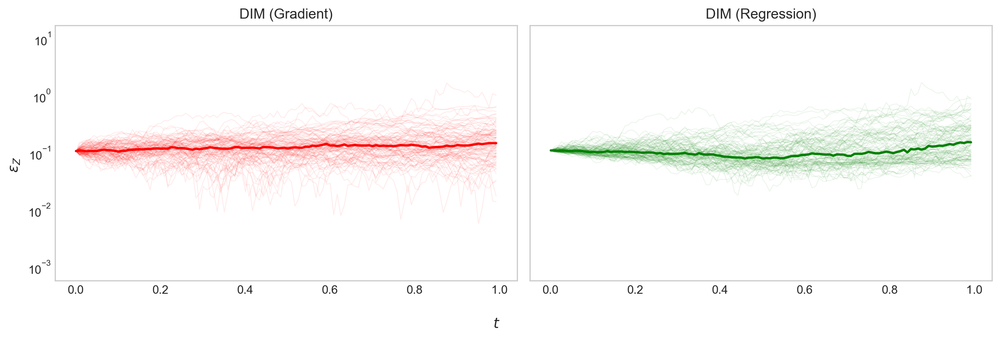

In [5]:
## 6. Error Analysis

# Extract shared data
X_paths = solution_grad['X']
time_grid = solution_grad['time']

# Model configurations
models = [(solver_grad.nn_Y, None), (solver_reg.nn_Y, solver_reg.nn_Z)]
z_methods = ['gradient', 'regression']
labels = ['DIM (Gradient)', 'DIM (Regression)']

# Y error analysis
print("Generating Y error plots...")
fig_y, axes_y = plot_Y_error_subplots(
    models=models,
    z_methods=z_methods,
    labels=labels,
    equation=eqn,
    X_paths=X_paths,
    time_grid=time_grid,
    device=DEVICE,
    analytical_Y_func=eqn.analytical_y,
    analytical_Y_kwargs={'T_terminal': solver_cfg_grad.T},
    num_error_paths=100,
    spaghetti_alpha=0.08,
    z_fp_iterations=5
)
plt.show()

# Z error analysis
print("Generating Z error plots...")
fig_z, axes_z = plot_Z_error_subplots(
    models=models,
    z_methods=z_methods,
    labels=labels,
    equation=eqn,
    X_paths=X_paths,
    time_grid=time_grid,
    device=DEVICE,
    analytical_Z_func=eqn.analytical_z,
    analytical_Z_kwargs={'T_terminal': solver_cfg_grad.T},
    num_error_paths=100,
    spaghetti_alpha=0.08,
    z_fp_iterations=5
)
plt.show()

---

# 2. Decoupled FBSDE

A high-dimensional problem adapted from Huré et al. (2020). The $d$-dimensional FBSDE system is defined by:

$$
\left\{
\begin{aligned}
dX_t &= \mu \mathbf{1}_d \, dt + \sigma \, dW_t, \quad X_0 = x_0, \\
-dY_t &= \begin{aligned}[t]
          \biggl[ &\left(\cos(\bar{X}_t) + 0.2 \sin(\bar{X}_t)\right) \exp\left(\frac{T-t}{2}\right) \\
                 &- \frac{1}{2} \left(\exp(T-t)\sin(\bar{X}_t) \cos(\bar{X}_t)\right)^2 
                 + \frac{1}{2d} \left(Y_t \bar{Z}_t\right)^2 \biggr] dt - Z_t dW_t, \end{aligned} \\
Y_T &= \cos(\bar{X}_T),
\end{aligned}
\right.
$$

where $X_t \in \mathbb{R}^d$, $Y_t \in \mathbb{R}$, $Z_t \in \mathbb{R}^{1 \times d}$, $\mathbf{1}_d$ is a $d$-dimensional vector of ones, and the scalar quantities $\bar{X}_t = \sum_{i=1}^d X_t^i$ and $\bar{Z}_t = \sum_{j=1}^d Z_t^j$. The parameters are $\mu = 0.2/d$ and $\sigma = 1/\sqrt{d}$. The analytical solution is given component-wise by:

$$
\left\{
\begin{aligned}
Y_t &= \exp\left(\frac{T-t}{2}\right) \cos(\bar{X}_t), \\
Z_t^j &= -\sigma \exp\left(\frac{T-t}{2}\right) \sin(\bar{X}_t), \quad \text{for } j=1, \dots, d.
\end{aligned}
\right.
$$

In [6]:
## 1. Configuration

DIM_X = 3

print(f"Running Hure Benchmark (d={DIM_X}) on {DEVICE}")

# Shared Solver Settings
base_solver_cfg = {
    'T': 1.0,
    'N': 100,
    'num_paths': 2000,
    'picard_iterations': 5,
    'device': DEVICE
}

# Training Settings
train_cfg = TrainingConfig(
    batch_size=500,
    epochs=5,
    learning_rate=1e-4,
    lr_decay_step=2000,
    verbose=True
)

## 2. Equation Setup

# Physics: Hure Equation
eqn = HureEquation(dim_x=DIM_X)
input_dim = 1 + DIM_X
hidden_layers = [40, 40, 40, 40]

## 3. Method 1: Gradient Method

print("\n=== Running Gradient Method ===")
solver_cfg_grad = SolverConfig(**base_solver_cfg, z_method='gradient')

nn_Y_grad = MLP(input_dim=input_dim, output_dim=eqn.dim_y, hidden_dims=hidden_layers)

solver_grad = UncoupledFBSDESolver(
    equation=eqn,
    solver_config=solver_cfg_grad,
    training_config=train_cfg,
    nn_Y=nn_Y_grad,
    nn_Z=None
)

solution_grad = solver_grad.solve()

## 4. Method 2: Regression Method

print("\n=== Running Regression Method ===")
solver_cfg_reg = SolverConfig(**base_solver_cfg, z_method='regression')

nn_Y_reg = MLP(input_dim=input_dim, output_dim=eqn.dim_y, hidden_dims=hidden_layers)
output_dim_z = eqn.dim_y * eqn.dim_w
nn_Z_reg = MLP(input_dim=input_dim, output_dim=output_dim_z, hidden_dims=hidden_layers)

solver_reg = UncoupledFBSDESolver(
    equation=eqn,
    solver_config=solver_cfg_reg,
    training_config=train_cfg,
    nn_Y=nn_Y_reg,
    nn_Z=nn_Z_reg
)

solution_reg = solver_reg.solve()

print("\n✓ Both methods completed successfully")

Running Hure Benchmark (d=3) on cpu

=== Running Gradient Method ===
2026-02-03 00:01:39 - dim_fbsde.solvers.uncoupled - Starting Uncoupled Solver (gradient)...
2026-02-03 00:01:40 - dim_fbsde.solvers.uncoupled - Picard Iter 1/5: Error=1.3373e+00 | Mean Y_Loss=5.2636e-01
2026-02-03 00:01:42 - dim_fbsde.solvers.uncoupled - Picard Iter 2/5: Error=2.2194e-01 | Mean Y_Loss=2.5218e-01
2026-02-03 00:01:43 - dim_fbsde.solvers.uncoupled - Picard Iter 3/5: Error=6.0132e-02 | Mean Y_Loss=2.5056e-01
2026-02-03 00:01:44 - dim_fbsde.solvers.uncoupled - Picard Iter 4/5: Error=1.5058e-02 | Mean Y_Loss=2.4268e-01
2026-02-03 00:01:45 - dim_fbsde.solvers.uncoupled - Picard Iter 5/5: Error=5.5606e-03 | Mean Y_Loss=2.4072e-01

=== Running Regression Method ===
2026-02-03 00:01:45 - dim_fbsde.solvers.uncoupled - Starting Uncoupled Solver (regression)...
2026-02-03 00:01:48 - dim_fbsde.solvers.uncoupled - Picard Iter 1/5: Error=1.2760e+00 | Mean Y_Loss=4.6507e-01
2026-02-03 00:01:50 - dim_fbsde.solvers.unco

2026-02-03 00:02:05 - dim_fbsde.utils.visualizations - Using model-based comparison: evaluating all models on 5 identical X paths


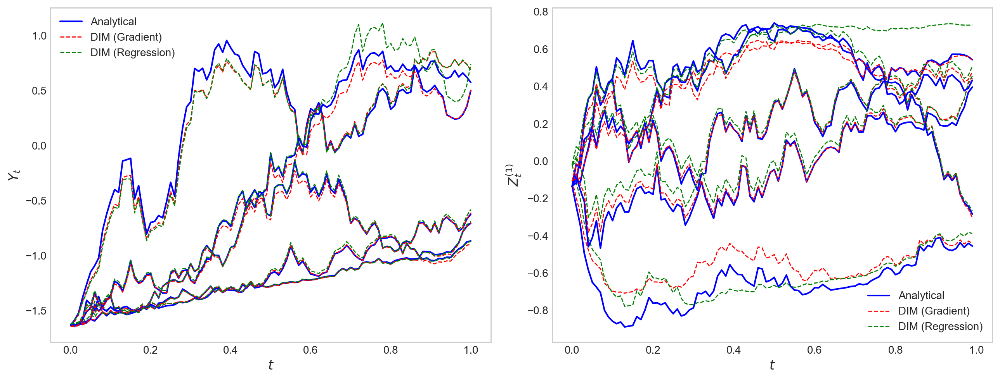

In [7]:
## 5. Method Comparison Visualization

# Compare both methods against analytical solution using model-based evaluation
# This ensures both methods are evaluated on identical X paths for fair comparison
fig, axes = plot_pathwise_comparison(
    solutions=[solution_grad],  # Use X paths from first solution
    labels=['DIM (Gradient)', 'DIM (Regression)'],
    models=[(solver_grad.nn_Y, None), (solver_reg.nn_Y, solver_reg.nn_Z)],
    z_methods=['gradient', 'regression'],
    equation=eqn,  # Required for gradient method to compute Z = σ·∇Y
    analytical_Y_func=eqn.analytical_y,
    analytical_Z_func=eqn.analytical_z,
    analytical_Y_kwargs={'T_terminal': solver_cfg_grad.T},
    analytical_Z_kwargs={'T_terminal': solver_cfg_grad.T},
    component_idx=0,
    device=DEVICE,
    num_paths_to_plot=5
)
plt.show()

Generating Y error plots...
2026-02-03 00:02:11 - dim_fbsde.utils.visualizations - Computing analytical Y for 100 paths...
2026-02-03 00:02:11 - dim_fbsde.utils.visualizations - Computing Y errors for DIM (Gradient)...
2026-02-03 00:02:12 - dim_fbsde.utils.visualizations - Computing Y errors for DIM (Regression)...


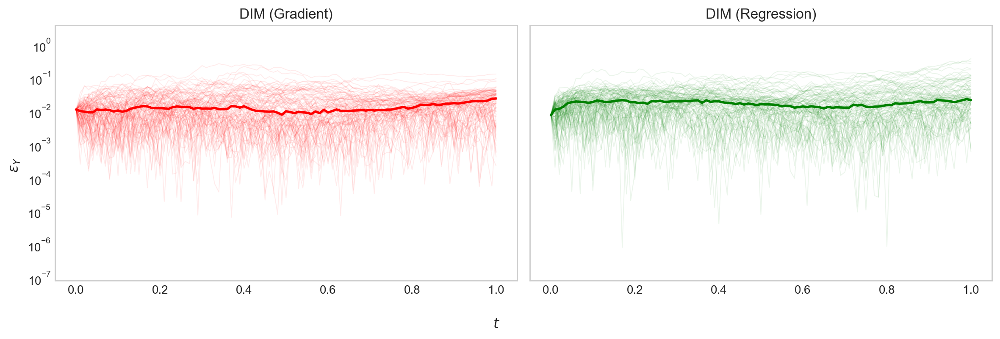

Generating Z error plots...
2026-02-03 00:02:12 - dim_fbsde.utils.visualizations - Computing analytical Z for 100 paths...
2026-02-03 00:02:12 - dim_fbsde.utils.visualizations - Computing Z errors for DIM (Gradient)...
2026-02-03 00:02:13 - dim_fbsde.utils.visualizations - Computing Z errors for DIM (Regression)...


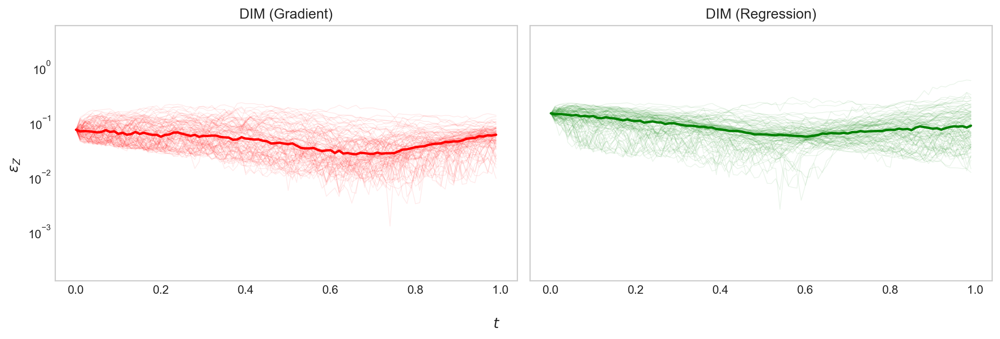

In [8]:
## 6. Error Analysis

# Extract shared data
X_paths = solution_grad['X']
time_grid = solution_grad['time']

# Model configurations
models = [(solver_grad.nn_Y, None), (solver_reg.nn_Y, solver_reg.nn_Z)]
z_methods = ['gradient', 'regression']
labels = ['DIM (Gradient)', 'DIM (Regression)']

# Y error analysis
print("Generating Y error plots...")
fig_y, axes_y = plot_Y_error_subplots(
    models=models,
    z_methods=z_methods,
    labels=labels,
    equation=eqn,
    X_paths=X_paths,
    time_grid=time_grid,
    device=DEVICE,
    analytical_Y_func=eqn.analytical_y,
    analytical_Y_kwargs={'T_terminal': solver_cfg_grad.T},
    num_error_paths=100,
    spaghetti_alpha=0.08,
    z_fp_iterations=5
)
plt.show()

# Z error analysis
print("Generating Z error plots...")
fig_z, axes_z = plot_Z_error_subplots(
    models=models,
    z_methods=z_methods,
    labels=labels,
    equation=eqn,
    X_paths=X_paths,
    time_grid=time_grid,
    device=DEVICE,
    analytical_Z_func=eqn.analytical_z,
    analytical_Z_kwargs={'T_terminal': solver_cfg_grad.T},
    num_error_paths=100,
    spaghetti_alpha=0.08,
    z_fp_iterations=5
)
plt.show()

---

# 3. Z-Coupled FBSDE

An example generalized from Hwang et al., which features a coupling through the $Z$ process in the forward drift. The $d$-dimensional system is defined by:

$$
\left\{
\begin{aligned}
    dX_t &= \left(-\frac{1}{2}\sin(t+\bar{X}_t)\cos(t+\bar{X}_t)\left(\sin^2(t+\bar{X}_t) + \frac{1}{d}\bar{Z}_t\right)\right) \mathbf{1}_d \, dt 
    \\ &\qquad + \cos(t+\bar{X}_t) \, dW_t, \\
    -dY_t &= \left(Y_t \bar{Z}_t - \cos(t+\bar{X}_t)\right) dt - Z_t dW_t, \\
    Y_T &= \sin(T+\bar{X}_T),
\end{aligned}
\right.
$$

where $\bar{X}_t = \sum_{i=1}^d X_t^i$, $\bar{Z}_t = \sum_{j=1}^d Z_t^j$. The experiment is conducted over the time horizon $[0, T] = [0,1]$ with an initial state $x_0 \in \mathbb{R}^d$ where each component is equal to $0.5$. The analytical solution is:

$$
\left\{
\begin{aligned}
    Y_t &= \sin(t+\bar{X}_t), \\
    Z_t^j &= \cos^2(t+\bar{X}_t), \quad \text{for } j=1, \dots, d.
\end{aligned}
\right.
$$

In [9]:
## 1. Configuration

DIM_X = 1

print(f"Running Z-Coupled (d={DIM_X}) on {DEVICE}")

# Shared Solver Settings
base_solver_cfg = {
    'T': 1.0,
    'N': 120,
    'num_paths': 3000,
    'global_iterations': 3,
    'picard_iterations': 3,
    'device': DEVICE
}

# Training Settings
train_cfg = TrainingConfig(
    batch_size=256,
    epochs=5,
    learning_rate=1e-3,
    lr_decay_step=1000,
    verbose=True
)

## 2. Equation Setup

# Physics: Z-Coupled Equation
eqn = ZCoupledEquation(dim_x=DIM_X)
input_dim = 1 + DIM_X 
hidden_layers = [64, 64, 64]

## 3. Method 1: Gradient Method

print("\n=== Running Gradient Method ===")
solver_cfg_grad = SolverConfig(**base_solver_cfg, z_method='gradient')

nn_Y_grad = MLP(input_dim=input_dim, output_dim=eqn.dim_y, hidden_dims=hidden_layers)

solver_grad = CoupledFBSDESolver(
    equation=eqn,
    solver_config=solver_cfg_grad,
    training_config=train_cfg,
    nn_Y=nn_Y_grad,
    nn_Z=None
)

solution_grad = solver_grad.solve()

## 4. Method 2: Regression Method

print("\n=== Running Regression Method ===")
solver_cfg_reg = SolverConfig(**base_solver_cfg, z_method='regression')

nn_Y_reg = MLP(input_dim=input_dim, output_dim=eqn.dim_y, hidden_dims=hidden_layers)
output_dim_z = eqn.dim_y * eqn.dim_w
nn_Z_reg = MLP(input_dim=input_dim, output_dim=output_dim_z, hidden_dims=hidden_layers)

solver_reg = CoupledFBSDESolver(
    equation=eqn,
    solver_config=solver_cfg_reg,
    training_config=train_cfg,
    nn_Y=nn_Y_reg,
    nn_Z=nn_Z_reg
)

solution_reg = solver_reg.solve()

print("\n✓ Both methods completed successfully")

Running Z-Coupled (d=1) on cpu

=== Running Gradient Method ===
2026-02-03 00:02:19 - dim_fbsde.solvers.coupled - Starting Coupled Solver (Global Iters: 3, Inner Iters: 3)...
2026-02-03 00:02:19 - dim_fbsde.solvers.coupled - 
--- Global Iteration 1/3 ---
2026-02-03 00:02:19 - dim_fbsde.solvers.uncoupled - Starting Uncoupled Solver (gradient)...
2026-02-03 00:02:22 - dim_fbsde.solvers.uncoupled - Picard Iter 1/3: Error=8.5455e-01 | Mean Y_Loss=9.3429e-02
2026-02-03 00:02:25 - dim_fbsde.solvers.uncoupled - Picard Iter 2/3: Error=9.7742e-02 | Mean Y_Loss=9.7328e-02
2026-02-03 00:02:28 - dim_fbsde.solvers.uncoupled - Picard Iter 3/3: Error=1.8664e-02 | Mean Y_Loss=9.7786e-02
2026-02-03 00:02:28 - dim_fbsde.solvers.coupled - Global Error (Y_k vs Y_k-1): 7.8946e-01
2026-02-03 00:02:28 - dim_fbsde.solvers.coupled - 
--- Global Iteration 2/3 ---
2026-02-03 00:02:28 - dim_fbsde.solvers.uncoupled - Starting Uncoupled Solver (gradient)...
2026-02-03 00:02:31 - dim_fbsde.solvers.uncoupled - Picard

2026-02-03 00:03:53 - dim_fbsde.utils.visualizations - Using model-based comparison: evaluating all models on 5 identical X paths


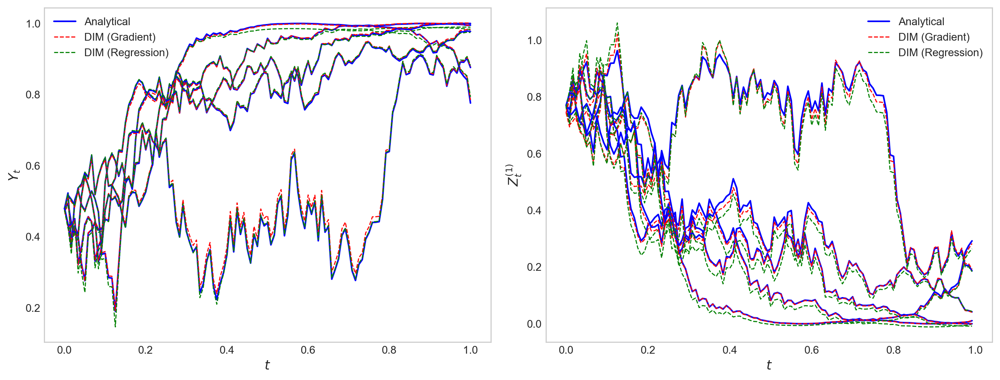

In [13]:
## 5. Method Comparison Visualization

# Compare both methods against analytical solution using model-based evaluation
fig, axes = plot_pathwise_comparison(
    solutions=[solution_grad],  # Use X paths from first solution
    labels=['DIM (Gradient)', 'DIM (Regression)'],
    models=[(solver_grad.nn_Y, None), (solver_reg.nn_Y, solver_reg.nn_Z)],
    z_methods=['gradient', 'regression'],
    equation=eqn,  # Required for gradient method to compute Z = σ·∇Y
    analytical_Y_func=eqn.analytical_y,
    analytical_Z_func=eqn.analytical_z,
    component_idx=0,
    device=DEVICE,
    num_paths_to_plot=5
)
plt.show()

Generating Y error plots...
2026-02-03 00:04:01 - dim_fbsde.utils.visualizations - Computing analytical Y for 100 paths...
2026-02-03 00:04:01 - dim_fbsde.utils.visualizations - Computing Y errors for DIM (Gradient)...
2026-02-03 00:04:02 - dim_fbsde.utils.visualizations - Computing Y errors for DIM (Regression)...


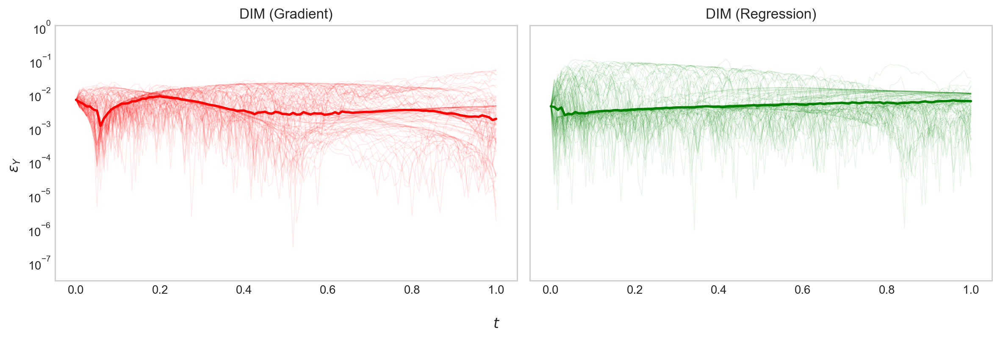

Generating Z error plots...
2026-02-03 00:04:02 - dim_fbsde.utils.visualizations - Computing analytical Z for 100 paths...
2026-02-03 00:04:02 - dim_fbsde.utils.visualizations - Computing Z errors for DIM (Gradient)...
2026-02-03 00:04:03 - dim_fbsde.utils.visualizations - Computing Z errors for DIM (Regression)...


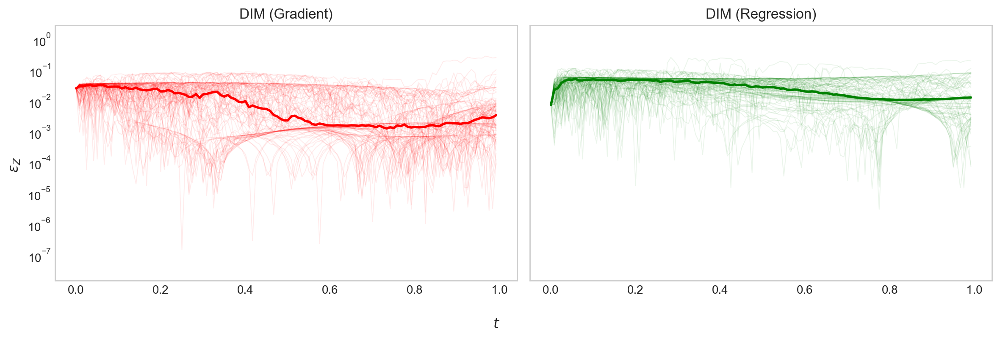

In [14]:
## 6. Error Analysis

# Extract shared data
X_paths = solution_grad['X']
time_grid = solution_grad['time']

# Model configurations
models = [(solver_grad.nn_Y, None), (solver_reg.nn_Y, solver_reg.nn_Z)]
z_methods = ['gradient', 'regression']
labels = ['DIM (Gradient)', 'DIM (Regression)']

# Y error analysis
print("Generating Y error plots...")
fig_y, axes_y = plot_Y_error_subplots(
    models=models,
    z_methods=z_methods,
    labels=labels,
    equation=eqn,
    X_paths=X_paths,
    time_grid=time_grid,
    device=DEVICE,
    analytical_Y_func=eqn.analytical_y,
    num_error_paths=100,
    spaghetti_alpha=0.08,
    z_fp_iterations=5
)
plt.show()

# Z error analysis
print("Generating Z error plots...")
fig_z, axes_z = plot_Z_error_subplots(
    models=models,
    z_methods=z_methods,
    labels=labels,
    equation=eqn,
    X_paths=X_paths,
    time_grid=time_grid,
    device=DEVICE,
    analytical_Z_func=eqn.analytical_z,
    num_error_paths=100,
    spaghetti_alpha=0.08,
    z_fp_iterations=5
)
plt.show()

---

# 4. Fully-Coupled FBSDE

A fully-coupled FBSDE adapted from Ji et al., where both the drift and diffusion depend on the backward processes. The $d$-dimensional system is defined by:

$$
\left\{
\begin{aligned}
    dX_t &= \left(-\frac{1}{2}\sin(t+\bar{X}_t)\cos(t+\bar{X}_t)\left(Y_t^2 + \frac{1}{d}\bar{Z}_t\right)\right)\mathbf{1}_d \, dt \\
    & \qquad + \frac{1}{2}\cos(t+\bar{X}_t)\left(Y_t\sin(t+\bar{X}_t) + \frac{1}{d}\bar{Z}_t + 1\right) dW_t, \\
    -dY_t &= \left(Y_t \bar{Z}_t - \cos(t+\bar{X}_t)\right) dt - Z_t dW_t, \\
    Y_T &= \sin(T+\bar{X}_T),
\end{aligned}
\right.
$$

where notation is as previously defined. The experiment is conducted over the time horizon $[0, T] = [0,1]$ for dimension $d=1$, with an initial state $x_0 = 0$. The analytical solution is:

$$
\left\{
\begin{aligned}
    Y_t &= \sin(t+\bar{X}_t), \\
    Z_t^j &= \cos^2(t+\bar{X}_t), \quad \text{for } j=1, \dots, d.
\end{aligned}
\right.
$$

In [15]:
## 1. Configuration

DIM_X = 1

print(f"Running Fully-Coupled (d={DIM_X}) on {DEVICE}")

# Shared Solver Settings
base_solver_cfg = {
    'T': 1.0,
    'N': 120,
    'num_paths': 5000,
    'global_iterations': 3,
    'picard_iterations': 3,
    'device': DEVICE
}

# Training Settings
train_cfg = TrainingConfig(
    batch_size=500,
    epochs=5,
    learning_rate=1e-4,
    lr_decay_step=1000,
    verbose=True
)

## 2. Equation Setup

# Physics: Fully Coupled Equation
eqn = FullyCoupledEquation(dim_x=DIM_X)
input_dim = 1 + DIM_X 
hidden_layers = [64, 64, 64]

## 3. Method 1: Gradient Method

print("\n=== Running Gradient Method ===")
solver_cfg_grad = SolverConfig(**base_solver_cfg, z_method='gradient')

nn_Y_grad = MLP(input_dim=input_dim, output_dim=eqn.dim_y, hidden_dims=hidden_layers)

solver_grad = CoupledFBSDESolver(
    equation=eqn,
    solver_config=solver_cfg_grad,
    training_config=train_cfg,
    nn_Y=nn_Y_grad,
    nn_Z=None
)

solution_grad = solver_grad.solve()

## 4. Method 2: Regression Method

print("\n=== Running Regression Method ===")
solver_cfg_reg = SolverConfig(**base_solver_cfg, z_method='regression')

nn_Y_reg = MLP(input_dim=input_dim, output_dim=eqn.dim_y, hidden_dims=hidden_layers)
output_dim_z = eqn.dim_y * eqn.dim_w
nn_Z_reg = MLP(input_dim=input_dim, output_dim=output_dim_z, hidden_dims=hidden_layers)

solver_reg = CoupledFBSDESolver(
    equation=eqn,
    solver_config=solver_cfg_reg,
    training_config=train_cfg,
    nn_Y=nn_Y_reg,
    nn_Z=nn_Z_reg
)

solution_reg = solver_reg.solve()

print("\n✓ Both methods completed successfully")

Running Fully-Coupled (d=1) on cpu

=== Running Gradient Method ===
2026-02-03 00:04:10 - dim_fbsde.solvers.coupled - Starting Coupled Solver (Global Iters: 3, Inner Iters: 3)...
2026-02-03 00:04:10 - dim_fbsde.solvers.coupled - 
--- Global Iteration 1/3 ---
2026-02-03 00:04:10 - dim_fbsde.solvers.uncoupled - Starting Uncoupled Solver (gradient)...
2026-02-03 00:04:14 - dim_fbsde.solvers.uncoupled - Picard Iter 1/3: Error=5.7507e-01 | Mean Y_Loss=6.1145e-02
2026-02-03 00:04:18 - dim_fbsde.solvers.uncoupled - Picard Iter 2/3: Error=5.7829e-02 | Mean Y_Loss=5.8381e-02
2026-02-03 00:04:22 - dim_fbsde.solvers.uncoupled - Picard Iter 3/3: Error=5.9769e-02 | Mean Y_Loss=6.1979e-02
2026-02-03 00:04:22 - dim_fbsde.solvers.coupled - Global Error (Y_k vs Y_k-1): 6.1298e-01
2026-02-03 00:04:22 - dim_fbsde.solvers.coupled - 
--- Global Iteration 2/3 ---
2026-02-03 00:04:22 - dim_fbsde.solvers.uncoupled - Starting Uncoupled Solver (gradient)...
2026-02-03 00:04:26 - dim_fbsde.solvers.uncoupled - Pi

2026-02-03 00:06:27 - dim_fbsde.utils.visualizations - Using model-based comparison: evaluating all models on 5 identical X paths


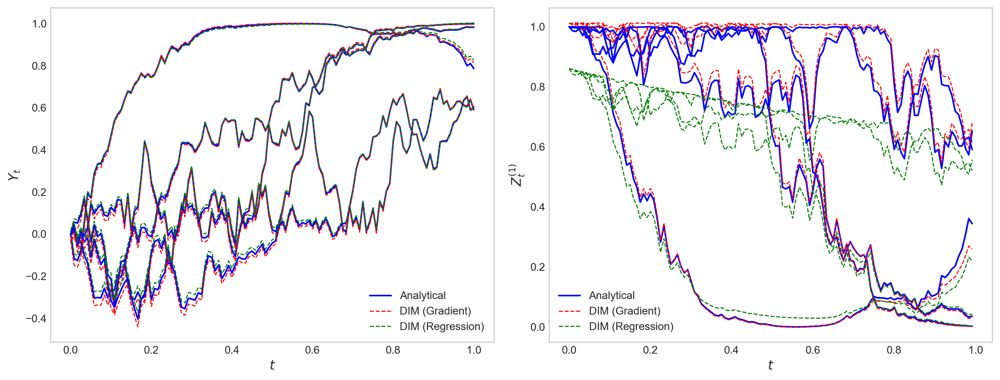

In [17]:
## 5. Method Comparison Visualization

# Compare both methods against analytical solution using model-based evaluation
fig, axes = plot_pathwise_comparison(
    solutions=[solution_grad],  # Use X paths from first solution
    labels=['DIM (Gradient)', 'DIM (Regression)'],
    models=[(solver_grad.nn_Y, None), (solver_reg.nn_Y, solver_reg.nn_Z)],
    z_methods=['gradient', 'regression'],
    equation=eqn,  # Required for gradient method to compute Z = σ·∇Y
    analytical_Y_func=eqn.analytical_y,
    analytical_Z_func=eqn.analytical_z,
    component_idx=0,
    device=DEVICE,
    num_paths_to_plot=5
)
plt.show()

Generating Y error plots...
2026-02-03 00:08:35 - dim_fbsde.utils.visualizations - Computing analytical Y for 100 paths...
2026-02-03 00:08:35 - dim_fbsde.utils.visualizations - Computing Y errors for DIM (Gradient)...
2026-02-03 00:08:38 - dim_fbsde.utils.visualizations - Computing Y errors for DIM (Regression)...


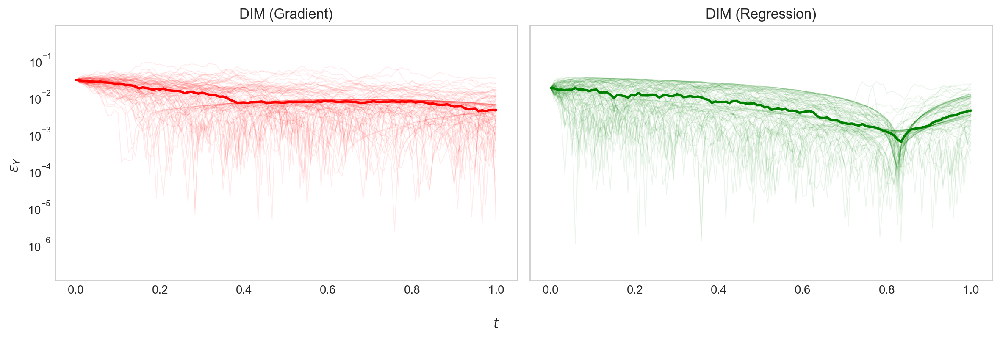

Generating Z error plots...
2026-02-03 00:08:38 - dim_fbsde.utils.visualizations - Computing analytical Z for 100 paths...
2026-02-03 00:08:38 - dim_fbsde.utils.visualizations - Computing Z errors for DIM (Gradient)...
2026-02-03 00:08:40 - dim_fbsde.utils.visualizations - Computing Z errors for DIM (Regression)...


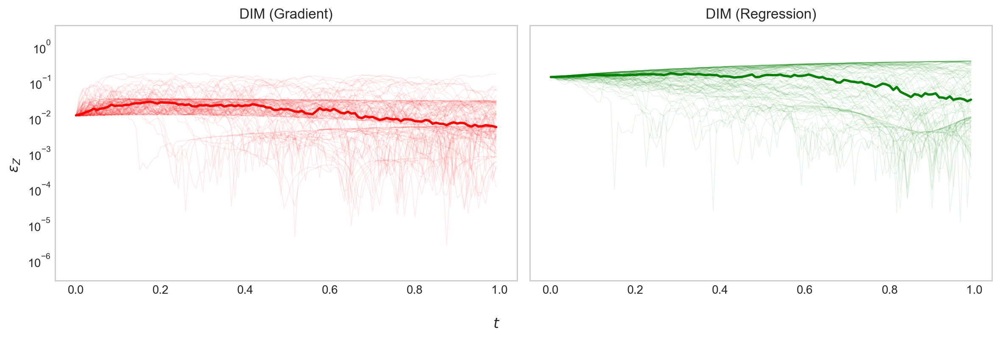

In [18]:
## 6. Error Analysis

# Extract shared data
X_paths = solution_grad['X']
time_grid = solution_grad['time']

# Model configurations
models = [(solver_grad.nn_Y, None), (solver_reg.nn_Y, solver_reg.nn_Z)]
z_methods = ['gradient', 'regression']
labels = ['DIM (Gradient)', 'DIM (Regression)']

# Y error analysis
print("Generating Y error plots...")
fig_y, axes_y = plot_Y_error_subplots(
    models=models,
    z_methods=z_methods,
    labels=labels,
    equation=eqn,
    X_paths=X_paths,
    time_grid=time_grid,
    device=DEVICE,
    analytical_Y_func=eqn.analytical_y,
    num_error_paths=100,
    spaghetti_alpha=0.08,
    z_fp_iterations=5
)
plt.show()

# Z error analysis
print("Generating Z error plots...")
fig_z, axes_z = plot_Z_error_subplots(
    models=models,
    z_methods=z_methods,
    labels=labels,
    equation=eqn,
    X_paths=X_paths,
    time_grid=time_grid,
    device=DEVICE,
    analytical_Z_func=eqn.analytical_z,
    num_error_paths=100,
    spaghetti_alpha=0.08,
    z_fp_iterations=5
)
plt.show()

---

# 5. McKean-Vlasov FBSDE

A $d$-dimensional McKean-Vlasov FBSDE system adapted from Han et al. The FBSDE is defined by:

$$
\left\{
\begin{aligned}
dX_t^i &= \biggl[ \sin\left(\mathbb{E}_{x'_t \sim \mathcal{L}(X_t)} \left[e^{-\frac{\|X_t - x'_t\|^2}{d}}\right]\right) - e^{-\frac{\|X_t\|^2}{d+2t}} \left(\frac{d}{d+2t}\right)^{\frac{d}{2}} \\
&\qquad + \frac{1}{2}\left(\mathbb{E}[Y_t] - \sin(t)e^{-\frac{t}{2}}\right) \biggr] dt + dW_t^i, \\
-dY_t &= -\left[ \frac{1}{\sqrt{d}}\bar{Z}_t - \frac{Y_t}{2} + \sqrt{Y_t^2 + \|Z_t\|_2^2 + 1} - \sqrt{2} \right] dt - Z_t dW_t, \\
Y_T &= \sin\left(T + \frac{1}{\sqrt{d}}\bar{X}_T\right),
\end{aligned}
\right.
$$

where notation is as previously defined. The forward drift depends on the law of $X_t$, $\mathcal{L}(X_t)$, and the mean of the backward process, $\mathbb{E}[Y_t]$. The expectation $\mathbb{E}_{x'_t \sim \mathcal{L}(X_t)}[\cdot]$ denotes an average over the distribution of $X_t$. Numerically, these expectations are replaced by their empirical averages over the ensemble of simulated paths. The experiment is conducted over $[0, T] = [0,1]$ with $x_0 = 0$. The analytical solution is:

$$
\left\{
\begin{aligned}
Y_t &= \sin\left(t + \frac{1}{\sqrt{d}}\bar{X}_t\right), \\
Z_t^j &= \frac{1}{\sqrt{d}} \cos\left(t + \frac{1}{\sqrt{d}}\bar{X}_t\right), \quad \text{for } j=1, \dots, d.
\end{aligned}
\right.
$$

In [19]:
## 1. Configuration

DIM_X = 1

print(f"Running McKean-Vlasov (d={DIM_X}) on {DEVICE}")

# Shared Solver Settings
base_solver_cfg = {
    'T': 1.0,
    'N': 120,
    'num_paths': 3000,
    'global_iterations': 2,
    'picard_iterations': 3,
    'device': DEVICE
}

# Training Settings
train_cfg = TrainingConfig(
    batch_size=1000,
    epochs=5,
    learning_rate=5e-4,
    lr_decay_step=1000,
    verbose=True
)

## 2. Equation Setup

# Physics: McKean-Vlasov Equation
eqn = McKeanVlasovEquation(dim_x=DIM_X)
input_dim = 1 + DIM_X 
hidden_layers = [64, 64, 64]

## 3. Method 1: Gradient Method

print("\n=== Running Gradient Method ===")
solver_cfg_grad = SolverConfig(**base_solver_cfg, z_method='gradient')

nn_Y_grad = MLP(input_dim=input_dim, output_dim=eqn.dim_y, hidden_dims=hidden_layers)

solver_grad = McKeanVlasovSolver(
    equation=eqn,
    solver_config=solver_cfg_grad,
    training_config=train_cfg,
    nn_Y=nn_Y_grad,
    nn_Z=None
)

solution_grad = solver_grad.solve()

## 4. Method 2: Regression Method

print("\n=== Running Regression Method ===")
solver_cfg_reg = SolverConfig(**base_solver_cfg, z_method='regression')

nn_Y_reg = MLP(input_dim=input_dim, output_dim=eqn.dim_y, hidden_dims=hidden_layers)
output_dim_z = eqn.dim_y * eqn.dim_w
nn_Z_reg = MLP(input_dim=input_dim, output_dim=output_dim_z, hidden_dims=hidden_layers)

solver_reg = McKeanVlasovSolver(
    equation=eqn,
    solver_config=solver_cfg_reg,
    training_config=train_cfg,
    nn_Y=nn_Y_reg,
    nn_Z=nn_Z_reg
)

solution_reg = solver_reg.solve()

print("\n✓ Both methods completed successfully")

Running McKean-Vlasov (d=1) on cpu

=== Running Gradient Method ===
2026-02-03 00:11:56 - dim_fbsde.solvers.mckean_vlasov - Starting McKean-Vlasov Solver (Global Iters: 2, Inner Iters: 3)...
2026-02-03 00:11:56 - dim_fbsde.solvers.mckean_vlasov - 
--- Global Iteration 1/2 ---
2026-02-03 00:11:58 - dim_fbsde.solvers.uncoupled - Starting Uncoupled Solver (gradient)...
2026-02-03 00:11:59 - dim_fbsde.solvers.uncoupled - Picard Iter 1/3: Error=7.2524e-01 | Mean Y_Loss=1.8357e-01
2026-02-03 00:12:00 - dim_fbsde.solvers.uncoupled - Picard Iter 2/3: Error=3.5496e-01 | Mean Y_Loss=2.8940e-01
2026-02-03 00:12:02 - dim_fbsde.solvers.uncoupled - Picard Iter 3/3: Error=2.3385e-01 | Mean Y_Loss=3.0239e-01
2026-02-03 00:12:02 - dim_fbsde.solvers.mckean_vlasov - Global Error (Y_k vs Y_k-1): 5.7732e-01
2026-02-03 00:12:02 - dim_fbsde.solvers.mckean_vlasov - 
--- Global Iteration 2/2 ---
2026-02-03 00:12:04 - dim_fbsde.solvers.uncoupled - Starting Uncoupled Solver (gradient)...
2026-02-03 00:12:05 - di

2026-02-03 00:12:26 - dim_fbsde.utils.visualizations - Using model-based comparison: evaluating all models on 5 identical X paths


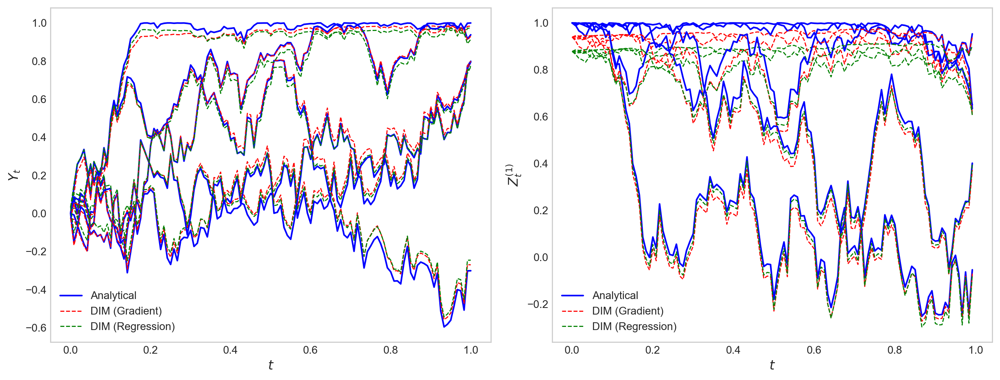

In [20]:
## 5. Method Comparison Visualization

# Compare both methods against analytical solution using model-based evaluation
fig, axes = plot_pathwise_comparison(
    solutions=[solution_grad],  # Use X paths from first solution
    labels=['DIM (Gradient)', 'DIM (Regression)'],
    models=[(solver_grad.nn_Y, None), (solver_reg.nn_Y, solver_reg.nn_Z)],
    z_methods=['gradient', 'regression'],
    equation=eqn,  # Required for gradient method to compute Z = σ·∇Y
    analytical_Y_func=eqn.analytical_y,
    analytical_Z_func=eqn.analytical_z,
    component_idx=0,
    device=DEVICE,
    num_paths_to_plot=5
)
plt.show()

Generating Y error plots...
2026-02-03 00:12:26 - dim_fbsde.utils.visualizations - Computing analytical Y for 100 paths...
2026-02-03 00:12:26 - dim_fbsde.utils.visualizations - Computing Y errors for DIM (Gradient)...
2026-02-03 00:12:27 - dim_fbsde.utils.visualizations - Computing Y errors for DIM (Regression)...


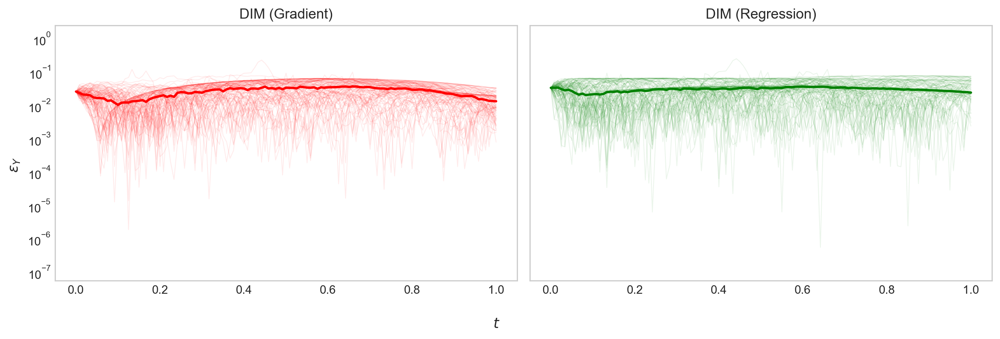

Generating Z error plots...
2026-02-03 00:12:27 - dim_fbsde.utils.visualizations - Computing analytical Z for 100 paths...
2026-02-03 00:12:28 - dim_fbsde.utils.visualizations - Computing Z errors for DIM (Gradient)...
2026-02-03 00:12:29 - dim_fbsde.utils.visualizations - Computing Z errors for DIM (Regression)...


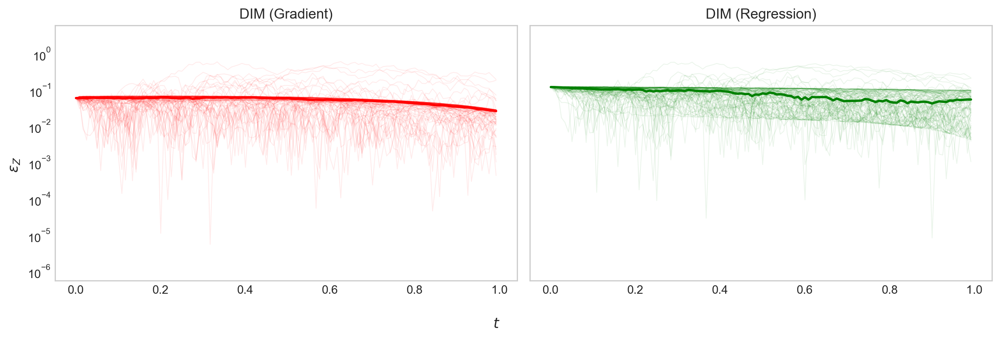

In [21]:
## 6. Error Analysis

# Extract shared data
X_paths = solution_grad['X']
time_grid = solution_grad['time']

# Model configurations
models = [(solver_grad.nn_Y, None), (solver_reg.nn_Y, solver_reg.nn_Z)]
z_methods = ['gradient', 'regression']
labels = ['DIM (Gradient)', 'DIM (Regression)']

# Y error analysis
print("Generating Y error plots...")
fig_y, axes_y = plot_Y_error_subplots(
    models=models,
    z_methods=z_methods,
    labels=labels,
    equation=eqn,
    X_paths=X_paths,
    time_grid=time_grid,
    device=DEVICE,
    analytical_Y_func=eqn.analytical_y,
    num_error_paths=100,
    spaghetti_alpha=0.08,
    z_fp_iterations=5
)
plt.show()

# Z error analysis
print("Generating Z error plots...")
fig_z, axes_z = plot_Z_error_subplots(
    models=models,
    z_methods=z_methods,
    labels=labels,
    equation=eqn,
    X_paths=X_paths,
    time_grid=time_grid,
    device=DEVICE,
    analytical_Z_func=eqn.analytical_z,
    num_error_paths=100,
    spaghetti_alpha=0.08,
    z_fp_iterations=5
)
plt.show()